In [3]:
import librosa as lr
import numpy as np
import scipy.signal as signal
import soundfile as sf
import matplotlib.pyplot as plt
from scipy.io import wavfile
import IPython.display as ipd



In [ ]:
!pip install torch
!pip install noisereduce

In [1]:
import psola
import noisereduce as nr
import torch

C:\Users\chorj\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [4]:

# Replace the path with the correct path to your file
filepath = 'C:\\Users\\chorj\\Downloads\\WavFiles\\ICT_Project'
input_file = filepath + '\\Hightake2_wav.wav'
#input_file = filepath + '\\MR_2.mp3'
#input_file = filepath + '\\Tell Me.wav'
impulse_file = filepath + '\\Sample_IR.wav'

audio, sr = sf.read(input_file)
if audio.ndim > 1:
    mono_audio = audio[:,0]
else: 
    mono_audio = audio
# Convert to mono for convenience
#mono_audio = audio.mean(axis=1)

audio_data, sr = lr.load(input_file, sr=None)
ipd.Audio(audio_data, rate=sr)
audio_mono = lr.to_mono(audio_data)

#audio, sr = lr.load(filepath, sr=None)
#print(type(mono_audio))
ipd.Audio(mono_audio, rate=sr)


In [ ]:
#TODO:M4A Conversion
import os
from pydub import AudioSegment
def convert_m4a_to_wav(m4a_path):
    """
    Convert an M4A file to WAV format.
    """
    #wav_path = os.path.splitext(m4a_path)[0] + '.wav'
    audio = AudioSegment.from_file(m4a_path, 'm4a')

    return audio
#input_file = filepath + '\\Tell Me.wav'
input_file = filepath + '\\Hightake2.m4a'

#wav_file = convert_m4a_to_wav(input_file)

# Now load with librosa
#y, sr = lr.load(wav_file, sr=None)
mp4Converted = convert_m4a_to_wav(input_file)
audio_data, sr = lr.load(mp4Converted, sr=None)
ipd.Audio(audio_data, rate=sr)
#audio.export("High take2.wav", format="wav")


In [ ]:
# Librosa Audio Sample Rate를 받고 waveform visualization 반환
def show_waveform(audio, sr):

    fig, ax = plt.subplots()
    time = lr.samples_to_time(range(len(audio)), sr=sr)
    ax.plot(time, audio)
    ax.set(xlabel = 'Time (s)', ylabel = 'Sound Amplitude')

    plt.show()

show_waveform(audio_mono, sr)

In [ ]:
def show_spectrogram(audio, sr):
    fig, ax = plt.subplots()
    S = lr.feature.melspectrogram(y=audio, sr=sr)
    D = lr.power_to_db(S, ref=np.max)
    plt.figure(figsize=(10, 4))
    lr.display.specshow(D, sr=sr, y_axis='log', x_axis='time')
    plt.colorbar(format='%+2.0f dB')
    plt.title('Mel-scaled spectrogram')
    plt.ylim(20, None)  # Set the y-axis range to be greater than 20
    plt.tight_layout()
    #st.pyplot(fig)
    plt.show()

show_spectrogram(audio_mono, sr)

In [7]:
#Cutting Audio Fragment
def cut_audio(audio, sr, start_sec, end_sec):
    start_sample = int(start_sec * sr)
    end_sample = int(end_sec * sr)
    # Extract the desired segment
    segment = audio[start_sample:end_sample]
    return segment
#mono audio = sf file
#audio mono = lr file
#cut_audio = cut_audio(mono_audio, sr, 3, 6)

#ipd.Audio(cut_audio, rate=sr)

#시작과 끝 지점이 적절한지 판단
def validate_start_end(full, start, end):
    if start < 0:
        raise ValueError('Start time must be greater than 0')
        return False
    if end >= (full - 1):
        raise ValueError('End time must be less than the duration of the audio file')
        return False
    if end - start > 30:
        raise ValueError('Segment length must be less than or equal to 30 seconds')
        return False
    if start >= end:
        raise ValueError('End time must be greater than start time')
        return False
    return True

In [8]:
def summing (origin, mod, ratio, adder = 1):
    
    ratioMod = (float(ratio)/100) ** (1/adder)
    audio_sum = ratioMod * mod + (1-ratioMod) * origin
    return audio_sum

In [69]:
def normalize(audio, sr, target):

    max_amp = np.max(np.abs(audio))
    normalized_audio = np.zeros(len(audio))
    #print(len(audio))
    #print(np.arange(max_amp))
    for i in range(len(audio)):
        normalized_audio[i] = audio[i]/ (max_amp * (1/target))
    
    return normalized_audio

a = normalize(mono_audio, sr, 0.05)



In [10]:
#I: phone_filter(audio, sr, ratio)
def butter_bandpass(fs, order=5):
    lowcut = 500
    highcut = 2800
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    b, a = signal.butter(order, [low, high], btype='band')
    return b, a

def bandpass_filter(data, fs, order=5):
    b, a = butter_bandpass(fs, order=order)
    y = signal.lfilter(b, a, data)
    return y


#I: phone filter
#apply phone Filter to your sound
def phone(audio, sr, ratio):

    #ratioMod = float(ratio)/100
    b, a = butter_bandpass(sr, order=5)
    y = signal.lfilter(b, a, audio)
    #audio_sum = ratioMod * y + (1-ratioMod) * audio
    return summing(audio, y, ratio, adder = 3)

#phone(audio_mono, sr, 50)

#ipd.Audio(phone(audio_mono, sr, 50), rate=sr)

In [11]:
#E: Boost 7kHz by 3dB
def air(input_audio, sr, ratio):
    ratioMod = float(ratio)/100
    Q = 1.0  # Quality factor
    gain = 3  # Gain in dB
    freq = 7000 
    # Design a peaking EQ filter to boost 7 kHz
    b, a = signal.iirpeak(freq / (sr / 2), Q, gain)

    # Apply the filter
    audio_filtered = signal.lfilter(b, a, input_audio)

    audio_sum = ratioMod * audio_filtered + (1-ratioMod) * input_audio

    return audio_sum
#ipd.Audio(air(audio_mono, sr, 90), rate=sr)

In [12]:
#S: Reverb

#impulse_response, sr_ir = lr.read(impulse_file)
impulse_response, sr_ir = lr.load(impulse_file)

def pad_to_match(array_to_extend, reference_array):
    target_length = len(reference_array)
    current_length = len(array_to_extend)
    padding_size = target_length - current_length
    if padding_size > 0:
        array_to_extend = np.pad(array_to_extend, (0, padding_size), mode='constant')
    return array_to_extend

def reverb(audio, sr, impulse_audio, sr_ir, ratio):
    # Load the impulse response (replace 'path_to_your_impulse_response.wav' with the actual file path)
    ratioMod = float(ratio)/100 * 0.5

    # Apply reverb by convolving the audio with the impulse response
    reverberated_audio = signal.fftconvolve(audio, impulse_audio, mode='full')

    # Adjust the decay rate (replace 'decay_rate' with the desired value)
    decay_rate =  0.5 * ratioMod
    reverberated_audio *= decay_rate

    # Adjust the wet ratio (replace 'wet_ratio' with the desired value)
    wet_ratio = ratioMod
    audio = pad_to_match(audio, reverberated_audio)
    return (1 - wet_ratio) * audio + wet_ratio * reverberated_audio

#ipd.Audio(reverb(mono_audio, sr, impulse_response, sr_ir, 30), rate=sr)



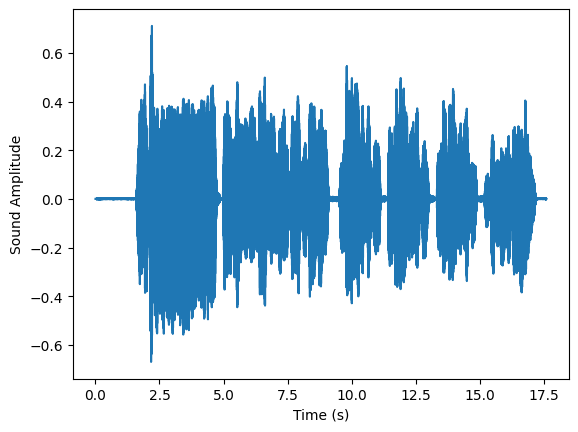

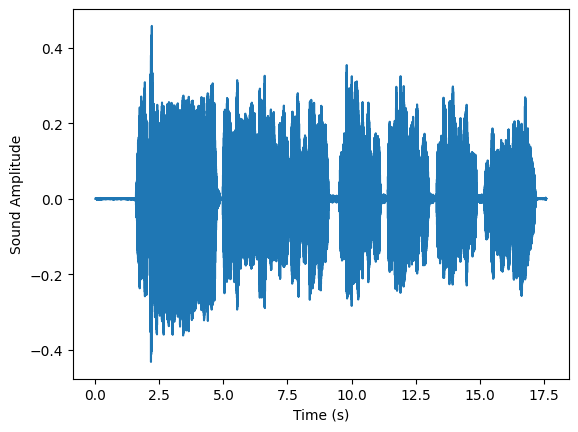

In [116]:
#N: Compression
def basic_compressor(signal, threshold, ratio):
    # Applying basic compression (no attack, release, or knee)
    compressed_signal = np.copy(signal)
    for i in range(len(compressed_signal)):
        if abs(compressed_signal[i]) > threshold:
            multfactor = (abs(compressed_signal[i]) - threshold ) ** 0.2
            if compressed_signal[i] > 0:
                compressed_signal[i] = threshold + (compressed_signal[i] - threshold) / (ratio / multfactor)
            else:
                compressed_signal[i] = -threshold + (compressed_signal[i] + threshold) / (ratio / multfactor)
    return compressed_signal

def compressor(input_audio, sr, ratio):
    ratiomod = (float(ratio)/100 + 1)/2
# Compression settings (example values, you should adjust these)
    threshold = 0.1  # Threshold (linear amplitude)
    ratio_comp = 1 + ratio/20     # Compression ratio
# Apply compression
    compressed_audio = basic_compressor(input_audio, threshold, ratio_comp)

# Mix compressed audio with original (50/50 mix)
    return input_audio * (1-ratiomod) + compressed_audio * ratiomod
# Save the resulting audio
audio_new = compressor(audio_mono, sr, 30)

show_waveform(audio_mono, sr)
show_waveform(audio_new, sr)
ipd.Audio(audio_new, rate = sr)

In [23]:
#F,T: Sum the original audio with the pitch shifted audio
def octHigh(input_audio, sr, ratio):
    ratioMod = float(ratio)/100 * 0.5
# Pitch shift the audio by 12 semitones (1 octave)
    octave_higher_audio = lr.effects.pitch_shift(input_audio, sr = sr, n_steps=12)
    
# Save the pitch-shifted audio
    audio_sum = ratioMod * octave_higher_audio + (1-ratioMod) * input_audio
    return audio_sum



def octLow(input_audio, sr, ratio):
    ratioMod = float(ratio)/100 * 0.5
# Pitch shift the audio by 12 semitones (1 octave)
    octave_lower_audio = lr.effects.pitch_shift(input_audio, sr = sr, n_steps=-12)

# Save the pitch-shifted audio
    audio_sum = ratioMod * octave_lower_audio + (1-ratioMod) * input_audio
    return audio_sum
#ipd.Audio(octHigh(mono_audio, sr, 50), rate=sr)
#ipd.Audio(audio_addOctaveLower(mono_audio, 50), rate=sr)

In [16]:
#P: Noise Cancellation

def noisereduce(y,sr, ratio):
# Process the audio data (y) here if needed
    ratioMod = float(ratio)/100
# Convert the floating-point audio data to 16-bit PCM format for WAV file
    y_16bit = np.int16(y / np.max(np.abs(y)) * 32767)

# Save the audio data as a WAV file
    reduced_noise = nr.reduce_noise(y=y, sr=sr, prop_decrease = ratioMod)
    data_float = reduced_noise.astype(np.float32) / 32768.0  # 16-bit PCM
    return data_float

Intermediate = noisereduce(mono_audio, sr, 90)
print = octHigh(Intermediate, sr, 90)
#ipd.Audio(print, rate=sr)

In [20]:
#J: Autotune
#https://github.com/JanWilczek/python-auto-tune/blob/main/auto_tune.py



SEMITONES_IN_OCTAVE = 12



SEMITONES_IN_OCTAVE = 12


def degrees_from(scale: str):
    """Return the pitch classes (degrees) that correspond to the given scale"""
    degrees = lr.key_to_degrees(scale)
    # To properly perform pitch rounding to the nearest degree from the scale, we need to repeat
    # the first degree raised by an octave. Otherwise, pitches slightly lower than the base degree
    # would be incorrectly assigned.
    degrees = np.concatenate((degrees, [degrees[0] + SEMITONES_IN_OCTAVE]))
    return degrees


def closest_pitch(f0):
    """Round the given pitch values to the nearest MIDI note numbers"""
    midi_note = np.around(lr.hz_to_midi(f0))
    # To preserve the nan values.
    nan_indices = np.isnan(f0)
    midi_note[nan_indices] = np.nan
    # Convert back to Hz.
    return lr.midi_to_hz(midi_note)


def closest_pitch_from_scale(f0, scale):
    """Return the pitch closest to f0 that belongs to the given scale"""
    # Preserve nan.
    if np.isnan(f0):
        return np.nan
    degrees = degrees_from(scale)
    midi_note = lr.hz_to_midi(f0)
    # Subtract the multiplicities of 12 so that we have the real-valued pitch class of the
    # input pitch.
    degree = midi_note % SEMITONES_IN_OCTAVE
    # Find the closest pitch class from the scale.
    degree_id = np.argmin(np.abs(degrees - degree))
    # Calculate the difference between the input pitch class and the desired pitch class.
    degree_difference = degree - degrees[degree_id]
    # Shift the input MIDI note number by the calculated difference.
    midi_note -= degree_difference
    # Convert to Hz.
    return lr.midi_to_hz(midi_note)

def autotune(audio, sr, ratio, plot=False):
    # Set some basis parameters.
    frame_length = 2048 
    hop_length = frame_length // 4
    fmin = lr.note_to_hz('C2')
    fmax = lr.note_to_hz('C7')

    # Pitch tracking using the PYIN algorithm.
    f0, voiced_flag, voiced_probabilities = lr.pyin(audio,
                                                         frame_length=frame_length,
                                                         hop_length=hop_length,
                                                         sr=sr,
                                                         fmin=fmin,
                                                         fmax=fmax)

    # Apply the chosen adjustment strategy to the pitch.
    corrected_f0 = closest_pitch(f0)

    if plot:
        # Plot the spectrogram, overlaid with the original pitch trajectory and the adjusted
        # pitch trajectory.
        stft = lr.stft(audio, n_fft=frame_length, hop_length=hop_length)
        time_points = lr.times_like(stft, sr=sr, hop_length=hop_length)
        log_stft = lr.amplitude_to_db(np.abs(stft), ref=np.max)
        fig, ax = plt.subplots()
        img = lr.display.specshow(log_stft, x_axis='time', y_axis='log', ax=ax, sr=sr, hop_length=hop_length, fmin=fmin, fmax=fmax)
        fig.colorbar(img, ax=ax, format="%+2.f dB")
        ax.plot(time_points, f0, label='original pitch', color='cyan', linewidth=2)
        ax.plot(time_points, corrected_f0, label='corrected pitch', color='orange', linewidth=1)
        ax.legend(loc='upper right')
        plt.ylabel('Frequency [Hz]')
        plt.xlabel('Time [M:SS]')
        plt.savefig('pitch_correction.png', dpi=300, bbox_inches='tight')
    modified = psola.vocode(audio, sample_rate=int(sr), target_pitch=corrected_f0, fmin=fmin, fmax=fmax)
    # Pitch-shifting using the PSOLA algorithm.
    return summing(audio, modified, ratio, adder = 1)


    
#pitch_corrected_y = autotune(mono_audio, sr, 80, False)

#ipd.Audio(pitch_corrected_y, rate=sr)



In [90]:
audio0 = autotune(mono_audio, sr, 100, False)
audio0 = normalize(audio0, sr, 0.5)
audio1 = phone(audio0, sr, 20)
audio1 = normalize(audio1, sr, 0.5)
audio2 = air(audio1, sr, 40)
audio2 = normalize(audio2, sr, 0.5)
audio3 = reverb(audio2, sr, impulse_response, sr_ir, 30)
audio3 = normalize(audio3, sr, 0.5)
audio4 = compressor(audio3, sr, 60)
audio4 = normalize(audio4, sr, 0.5)
audio5 = octHigh(audio4, sr, 30)
audio5 = normalize(audio5, sr, 0.5)
audio6 = octLow(audio5, sr, 20)
audio6 = normalize(audio6, sr, 0.5)

In [91]:
ipd.Audio(normalize(audio6, sr, target = 1), rate=sr)
#show_waveform(audio3, sr)
#show_waveform(audio4, sr)

In [ ]:
# How to write a wav file from Librosa
y, sr = lr.load('path_to_your_audio_file', sr=None)  # sr=None ensures original sampling rate is used

# Save the loaded audio as a WAV file
sf.write('output_file.wav', y, sr)

In [ ]:
#IE SN TF JP

sample_str = "I,30,4,E,0,-1,S,0,-1,N,50,3,T,20,2,F,10,5,J,35,6,P,15,1"

def parse(str):
    str = str.split(",")
    return str

def parse_into_three(str_origin):
    str = parse(str_origin)
    instruction = []
    degree = []
    order = []
    for i in range(len(str)):
        if i%3 ==0:
            instruction.append(str[i])
        elif i%3 ==1:
            degree.append(int(str[i]))
        else:
            order.append(int(str[i]))
    print("Instrcution: ", instruction)
    print("Degree: ", degree)
    print("Order: ", order)

    if len(instruction) == len(degree) == len(order):
        ans = {key: (degree[i], order[i]) for i, key in enumerate(instruction)}
    else:
        print("The lists are not of the same length.")
    return ans
    
def modify_dict(dict_origin):
    my_dict = dict_origin
    filtered_dict = {key: value for key, value in my_dict.items() if value[1] != -1}
    print(filtered_dict)
    sorted_dict = dict(sorted(filtered_dict.items(), key=lambda item: item[1][1]))
    print (sorted_dict)
    return sorted_dict

#원본 string을 받고 instruction, degree, order로 나눈 후 dict로 만드는 함수
def parse_process(str):
    return modify_dict(parse_into_three(str))

#dict과 원본값을 받은 이후 최종값과 그 과정을 출력하는 함수
def main_process(dict, object):
    ans = object
    submit = [ans]
    for key, value in dict.items():
        print("current value", value[0])
        if key == "I":
            ans = I(value[0], ans)
        elif key == "E":
            ans = E(value[0], ans)
        elif key == "S":
            ans = S(value[0], ans)
        elif key == "N":
            ans = N(value[0], ans)
        elif key == "T":
            ans = T(value[0], ans)
        elif key == "F":
            ans = F(value[0], ans)
        elif key == "J":
            ans = J(value[0], ans)
        elif key == "P":
            ans = P(value[0], ans)
        else:
            print("Invalid instruction")
        submit.append(ans)
    return submit

#def audio_addOctaveLower(input_audio, ratio): =
#def audio_addOctaveHigher(input_audio, ratio): =
#def audio_addAir(input_audio, ratio): =
#
def P(value, object):
    print("current object: ", object)
    print("P activated")
    return (object+value)
def T(value, object):
    print("current object: ", object)
    print("T activated")
    return (object*value)
def F(value, object):
    print("current object: ", object)
    print("F activated")
    return (object+value*object-value)
def J(value, object):
    print("current object: ", object)
    print("J activated")
    return (object-value)
def N(value, object):
    print("current object: ", object)
    print("N activated")
    return (object*value*value)
def S(value, object):
    print("current object: ", object)
    print("S activated")
    return (object*value/30)
def E(value, object):
    print("current object: ", object)
    print("E activated")
    return (object*value/20)
def I(value, object):
    print("current object: ", object)
    print("I activated")
    return (object*value/10)

main_process(parse_process(sample_str), 10)

Instrcution:  ['I', 'E', 'S', 'N', 'T', 'F', 'J', 'P']
Degree:  [30, 0, 0, 50, 20, 10, 35, 15]
Order:  [4, -1, -1, 3, 2, 5, 6, 1]
{'I': (30, 4), 'N': (50, 3), 'T': (20, 2), 'F': (10, 5), 'J': (35, 6), 'P': (15, 1)}
{'P': (15, 1), 'T': (20, 2), 'N': (50, 3), 'I': (30, 4), 'F': (10, 5), 'J': (35, 6)}
current value 15
current object:  10
P activated
current value 20
current object:  25
T activated
current value 50
current object:  500
N activated
current value 30
current object:  1250000
I activated
current value 10
current object:  3750000.0
F activated
current value 35
current object:  41249990.0
J activated


[10, 25, 500, 1250000, 3750000.0, 41249990.0, 41249955.0]

In [ ]:
def main_process(dict, object):
    ans = object
    for key, value in dict.items():
        print("current value", value[0])
        if key == "I":
            ans = I(value[0], ans)
        elif key == "E":
            ans = E(value[0], ans)
        elif key == "S":
            ans = S(value[0], ans)
        elif key == "N":
            ans = N(value[0], ans)
        elif key == "T":
            ans = T(value[0], ans)
        elif key == "F":
            ans = F(value[0], ans)
        elif key == "J":
            ans = J(value[0], ans)
        elif key == "P":
            ans = P(value[0], ans)
        else:
            print("Invalid instruction")
    return ans

def P(value, object):
    print("current object: ", object)
    print("P activated")
    return (object+value)
def T(value, object):
    print("current object: ", object)
    print("T activated")
    return (object*value)
def F(value, object):
    print("current object: ", object)
    print("F activated")
    return (object+value*object-value)
def J(value, object):
    print("current object: ", object)
    print("J activated")
    return (object-value)
def N(value, object):
    print("current object: ", object)
    print("N activated")
    return (object*value*value)
def S(value, object):
    print("current object: ", object)
    print("S activated")
    return (object*value/30)
def E(value, object):
    print("current object: ", object)
    print("E activated")
    return (object*value/20)
def I(value, object):
    print("current object: ", object)
    print("I activated")
    return (object*value/10)

main_process(run, 10)

current value 15
current object:  10
P activated
current value 20
current object:  25
T activated
current value 50
current object:  500
N activated
current value 30
current object:  1250000
I activated
current value 10
current object:  3750000.0
F activated
current value 35
current object:  41249990.0
J activated


41249955.0